# CONTENTS

1. IMPORTING LIBRARIES/DATA

2. DATA OVERVIEW

3. DATA WRANGLING
    
    3a. DROP COLUMNS
    
    3b. RENAME COLUMNS

4. DATA INTEGRITY CHECKS

    4a. ACCURACY

    4b. CONSISTENCY

5. INITIAL DATA EXPLORATION

    5a. QUANTITATIVE VARIABLES

    5b. QUALITATIVE VARIABLES

6. DATA PROFILE

7. EXPORTING DATA


# IMPORTING LIBRARIES/DATA

In [1]:
# import libraries
import numpy as np
import pandas as pd
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
import scipy
import os

In [2]:
# initialize path variable
path = r'/Users/smac_/Documents/Courses/CF Data Analytics Program/Data Immersion/Achievement 6/07-2023 NYC Airbnb Market Analysis'

In [3]:
# import dataset
df_listings = pd.read_csv(os.path.join(path, '02 Data', 'Raw Data', 'listings.csv'))

# DATA OVERVIEW

In [4]:
# first 5 rows
df_listings.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,5121,Rental unit in Brooklyn · ★4.52 · 1 bedroom · ...,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.29,2,0,0,NaN
1,2595,Rental unit in New York · ★4.68 · Studio · 1 b...,2845,Jennifer,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,240,30,49,2022-06-21,0.30,3,325,1,NaN
2,14991,Rental unit in New York · ★4.93 · 1 bedroom · ...,59023,Bianca,Manhattan,Lower East Side,40.72207,-73.98976,Private room,120,5,22,2023-05-14,0.14,1,268,3,NaN
3,5136,Rental unit in Brooklyn · ★5.0 · 2 bedrooms · ...,7378,Rebecca,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,276,21,3,2022-08-10,0.03,1,275,1,NaN
4,59709,Rental unit in New York · ★4.77 · 2 bedrooms ·...,186084,Ricardo & Ashlie,Manhattan,Chinatown,40.71780,-73.99320,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23,NaN


In [5]:
# last 5 rows
df_listings.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
43561,905031073149861760,Home in Brooklyn · ★New · 3 bedrooms · 3 beds ...,86368678,Jamel,Brooklyn,Canarsie,40.633458,-73.899472,Entire home/apt,208,3,0,NaN,NaN,3,358,0,NaN
43562,905038362467988591,Rental unit in Brooklyn · ★New · 1 bedroom · 1...,52064945,Sohaib,Brooklyn,Park Slope,40.677256,-73.981435,Private room,530,30,0,NaN,NaN,1,270,0,NaN
43563,905066559607295258,Rental unit in New York · ★New · 1 bedroom · 1...,22541573,Ken,Manhattan,East Village,40.732530,-73.989880,Entire home/apt,382,30,0,NaN,NaN,132,288,0,NaN
43564,905077900484113845,Rental unit in Brooklyn · ★New · 3 bedrooms · ...,151692758,Denis,Brooklyn,Canarsie,40.638210,-73.915920,Entire home/apt,199,2,0,NaN,NaN,1,155,0,NaN
43565,905109354552786380,Hotel in New York · ★New · 1 bedroom · 1 bed ·...,25138314,RoomPicks By Antony,Manhattan,Midtown,40.765086,-73.976717,Private room,662,1,0,NaN,NaN,116,250,0,NaN


In [6]:
# dataframe size
df_listings.shape

(43566, 18)

In [7]:
# column names and data types
df_listings.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
number_of_reviews_ltm               int64
license                           float64
dtype: object

# DATA WRANGLING

## DROP COLUMNS

In [8]:
# remove 'name & license' column
dropped_columns = ['name', 'host_name', 'license']
df_listings_1 = df_listings.drop(columns = dropped_columns)

In [9]:
# first 5 rows
df_listings_1.head()

,id,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm
0,5121,7356,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.29,2,0,0
1,2595,2845,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,240,30,49,2022-06-21,0.30,3,325,1
2,14991,59023,Manhattan,Lower East Side,40.72207,-73.98976,Private room,120,5,22,2023-05-14,0.14,1,268,3
3,5136,7378,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,276,21,3,2022-08-10,0.03,1,275,1
4,59709,186084,Manhattan,Chinatown,40.71780,-73.99320,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23


The `'license'` column consisted entirely of missing values, while the `'host_name'` column contained the first name of the host. The column `'name'` contained unstructured data representing the title of the listing in the Airbnb app. These columns were removed from the analysis as they were deemed irrelevant for the intended purpose.

## RENAME COLUMNS

In [10]:
# define new column names
new_col_names = {'neighbourhood_group' : 'nbhd_group',
                 'neighbourhood' : 'nbhd',
                 'minimum_nights' : 'min_nights',
                 'number_of_reviews' : 'reviews_count',
                 'reviews_per_month' : 'monthly_reviews',
                 'calculated_host_listings_count' : 'host_list_count',
                 'number_of_reviews_ltm' : 'reviews_count_ltm'}

In [11]:
# rename columns
df_listings_1.rename(columns = new_col_names, inplace = True)

In [12]:
# first 5 rows
df_listings_1.head()

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
0,5121,7356,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.29,2,0,0
1,2595,2845,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,240,30,49,2022-06-21,0.30,3,325,1
2,14991,59023,Manhattan,Lower East Side,40.72207,-73.98976,Private room,120,5,22,2023-05-14,0.14,1,268,3
3,5136,7378,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,276,21,3,2022-08-10,0.03,1,275,1
4,59709,186084,Manhattan,Chinatown,40.71780,-73.99320,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23


To enhance conciseness and readability, certain columns in the DataFrame were renamed.

# DATA INTEGRITY CHECKS

## ACCURACY

In [13]:
# summary stats
df_listings_1.describe()

,id,host_id,latitude,longitude,price,min_nights,reviews_count,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
count,4.356600e+04,4.356600e+04,43566.000000,43566.000000,43566.000000,43566.000000,43566.000000,33070.000000,43566.000000,43566.000000,43566.000000
mean,2.582283e+17,1.559275e+08,40.728677,-73.943917,225.216109,18.700271,26.368544,1.219748,30.934857,136.998256,7.882110
std,3.605864e+17,1.655706e+08,0.057564,0.056336,818.738268,27.804388,57.740520,1.777084,99.108628,137.346191,18.250976
min,2.595000e+03,1.678000e+03,40.500314,-74.249840,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000,0.000000
25%,2.021553e+07,1.647671e+07,40.687650,-73.981990,80.000000,2.000000,1.000000,0.130000,1.000000,0.000000,0.000000
50%,4.561689e+07,7.846297e+07,40.724524,-73.952720,136.000000,15.000000,5.000000,0.550000,1.000000,89.000000,1.000000
75%,6.797858e+17,2.789252e+08,40.762750,-73.924150,228.000000,30.000000,24.000000,1.800000,5.000000,278.000000,8.000000
max,9.059818e+17,5.180219e+08,40.911380,-73.710870,90120.000000,1250.000000,2024.000000,63.950000,569.000000,365.000000,1128.000000


Observations:
* The maximum values in the `'price'`, `'minimum_nights'`, `'number_of_reviews'`, and `'calculated_host_listings_count'` columns appear to be unusually high compared to the rest of the data.
* The minimum value in the `'price'` column is zero, which suggests that there are one or more listings that are either "free of charge" or have unavailable pricing information.

### `'price'` COLUMN

<Axes: xlabel='price', ylabel='price'>

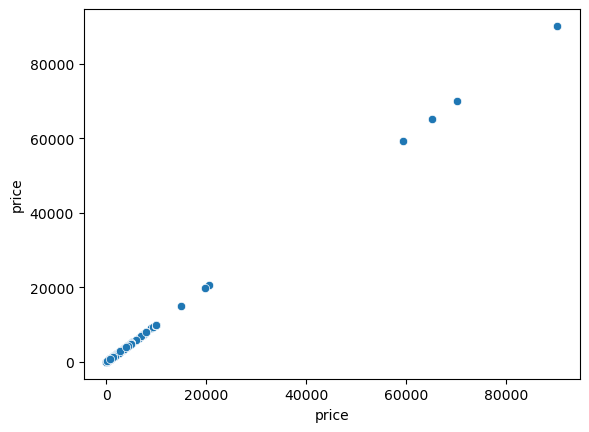

In [14]:
# generate scatterplot for outlier visualization in 'price'
sns.scatterplot(x = 'price', y = 'price', data = df_listings_1)

The scatterplot indicates that there are multiple extreme outliers in the 'price' column that surpass the $50,000 price mark. These rows should be removed since they greatly deviate the standard deviation of this column, which affects the accuracy of the average value.

In [15]:
# calculate the IQR of 'price'
price_q1 = df_listings_1['price'].quantile(0.25)
price_q3 = df_listings_1['price'].quantile(0.75)
price_IQR = price_q3 - price_q1
print(price_IQR)

148.0


In [16]:
# define upper and lower bounds for outliers in 'price'
price_spread = 1.5 * price_IQR
price_upper_bound = price_q3 + price_spread
price_lower_bound = price_q1 - price_spread
print(price_upper_bound)

450.0


In [17]:
# identify upper outliers in 'price'
price_outliers = df_listings_1[df_listings_1['price'] > price_upper_bound]
price_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
9,60164,289653,Manhattan,Tribeca,40.720120,-74.003970,Entire home/apt,500,30,110,2022-11-18,0.77,1,45,2
31,18152,69942,Manhattan,Upper East Side,40.769670,-73.948310,Private room,500,30,148,2019-09-01,1.04,1,331,0
60,23686,93790,Manhattan,West Village,40.729610,-74.003080,Entire home/apt,650,5,59,2023-01-04,0.45,2,157,5
80,66275,314941,Manhattan,Nolita,40.720360,-73.994350,Entire home/apt,514,1,212,2023-05-20,1.46,3,340,25
113,38663,165789,Brooklyn,Boerum Hill,40.684420,-73.980680,Entire home/apt,900,3,43,2023-05-29,0.32,1,191,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43556,905010695655980384,40319757,Manhattan,Hell's Kitchen,40.766500,-73.988536,Entire home/apt,1400,3,0,NaN,NaN,14,362,0
43558,905014056309001956,40319757,Manhattan,Civic Center,40.714259,-74.005310,Entire home/apt,997,1,0,NaN,NaN,14,365,0
43560,905019259198729323,40319757,Manhattan,Chinatown,40.718730,-74.001030,Entire home/apt,1300,1,0,NaN,NaN,14,364,0
43562,905038362467988591,52064945,Brooklyn,Park Slope,40.677256,-73.981435,Private room,530,30,0,NaN,NaN,1,270,0


In [18]:
# identify extreme outliers in 'price'
price_ex_outliers = df_listings_1[df_listings_1['price'] > 50000]
price_ex_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
2578,3924325,20278196,Brooklyn,East Flatbush,40.663040,-73.925070,Private room,70100,30,7,2020-11-01,0.07,2,363,0
9179,16289102,92493393,Staten Island,West Brighton,40.633040,-74.112750,Private room,65115,2,55,2022-07-29,0.70,3,32,5
22273,46332020,292204,Manhattan,East Harlem,40.793790,-73.947630,Entire home/apt,59386,30,2,2022-06-12,0.15,4,313,1
32012,662214912684522596,16190490,Queens,Forest Hills,40.709725,-73.848867,Private room,90120,1,1,2022-07-06,0.09,1,74,1


After conducting research on the most expensive Airbnb listings in NYC, it was found that none of them exceeded a price of $50,000. Consequently, these extreme outliers, which represent a negligible proportion of the total values, should be excluded from the dataset as they are not plausible and do not align with the expected range of prices.

In [19]:
# remove extreme outliers in 'price'
df_listings_2 = df_listings_1[df_listings_1['price'] < 50000]

In [20]:
# dataframe size
df_listings_2.shape

(43562, 15)

In [21]:
# identify records where 'price' = 0
df_listings_2[df_listings_2['price'] == 0]

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
19868,41740615,268417148,Manhattan,Midtown,40.744590,-73.985740,Hotel room,0,1,49,2023-04-18,1.12,1,0,9
20134,42065545,310429455,Manhattan,Midtown,40.759170,-73.969260,Hotel room,0,30,0,NaN,NaN,1,0,0
20136,42065563,309772430,Bronx,Mott Haven,40.815130,-73.916020,Hotel room,0,30,0,NaN,NaN,1,0,0
20138,42065564,314151200,Manhattan,Financial District,40.704620,-74.010270,Hotel room,0,1,56,2023-05-16,1.60,9,0,22
20150,42228997,314197504,Manhattan,Lower East Side,40.721860,-73.992780,Hotel room,0,30,0,NaN,NaN,1,0,0
20176,42279171,265458818,Manhattan,Chinatown,40.716100,-73.995180,Hotel room,0,1,336,2023-03-27,7.26,1,0,23
20198,42384501,262458398,Manhattan,Chelsea,40.747930,-73.991170,Hotel room,0,1,83,2022-04-17,1.86,1,0,0
20607,43035720,318559292,Manhattan,Midtown,40.750280,-73.985470,Hotel room,0,30,0,NaN,NaN,1,0,0
20705,43078550,334334264,Manhattan,Kips Bay,40.740970,-73.983390,Hotel room,0,30,0,NaN,NaN,1,0,0
20706,43247386,335072254,Manhattan,Hell's Kitchen,40.767560,-73.983120,Hotel room,0,1,24,2023-02-12,0.99,1,0,10


There are 16 records in the dataset where the price of the listing is set to 0. There is a consistent pattern for these listings—they are mostly hotel rooms located in Manhattan. To address this issue, we can apply two conditions to filter the DataFrame and focus on these specific listings. This will allow us to calculate the median value of ‘price’ as a suitable measure for imputation. By replacing these inaccurate values with the imputed ones based on the observed pattern, we can ensure impartiality and prevent any potential data distortions.

In [22]:
# filter dataframe based on pattern
manhattan_hotel_condition = (df_listings_2['nbhd_group'] == 'Manhattan') & (df_listings_2['room_type'] == 'Hotel room')
df_manhattan_hotel = df_listings_2[manhattan_hotel_condition]
df_manhattan_hotel

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
5028,7987209,42154621,Manhattan,Theater District,40.757280,-73.982530,Hotel room,1245,30,131,2021-10-06,1.40,1,332,0
9544,17097495,3236595,Manhattan,Harlem,40.809000,-73.951660,Hotel room,150,1,89,2022-12-27,1.16,4,60,9
10176,18652544,120762452,Manhattan,Murray Hill,40.748140,-73.975850,Hotel room,240,60,1,2019-11-04,0.02,83,358,0
10817,20189416,52491837,Manhattan,Midtown,40.753500,-73.972250,Hotel room,88,3,13,2023-04-05,0.19,1,0,6
11288,21192158,120762452,Manhattan,Murray Hill,40.750130,-73.976900,Hotel room,160,30,7,2022-08-15,0.13,83,343,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20708,43247631,318788301,Manhattan,Hell's Kitchen,40.761750,-73.988200,Hotel room,0,30,0,NaN,NaN,1,0,0
20710,43205598,335389657,Manhattan,Midtown,40.764480,-73.980550,Hotel room,0,1,9,2020-12-27,0.28,1,0,0
22188,46336133,375044940,Manhattan,Chelsea,40.755322,-74.001772,Hotel room,0,1,0,NaN,NaN,1,0,0
22472,46723973,376877842,Manhattan,Hell's Kitchen,40.765708,-73.995575,Hotel room,0,1,1,2021-06-13,0.04,1,0,0


In [23]:
# calculate median value of 'price' from filtered dataframe
price_median_manhattan_hotel = df_manhattan_hotel['price'].median()
print(price_median_manhattan_hotel)

428.0


In [24]:
# impute values where 'price' == 0 with calculated median based on observed pattern
df_listings_2.loc[(df_listings_2['nbhd_group'] == 'Manhattan') & (df_listings_2['room_type'] == 'Hotel room') & (df_listings_2['price'] == 0), 'price'] = price_median_manhattan_hotel

In [25]:
# identify records where 'price' = 0
df_listings_2[df_listings_2['price'] == 0]

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
20136,42065563,309772430,Bronx,Mott Haven,40.81513,-73.916020,Hotel room,0,30,0,NaN,NaN,1,0,0
21988,46087899,373522899,Brooklyn,Williamsburg,40.72121,-73.957209,Hotel room,0,1,0,NaN,NaN,15,0,0


After examining the two records with a price of zero, it was determined that they do not exhibit any noticeable patterns. As they only make up a negligible portion of the sample, removing them from the DataFrame will not significantly impact the results. Therefore, it was decided to exclude these records.

In [26]:
# remove records where 'price' == 0
df_listings_2 = df_listings_2[df_listings_2['price'] != 0]

### `'minimum_nights'` COLUMN

<Axes: xlabel='min_nights', ylabel='min_nights'>

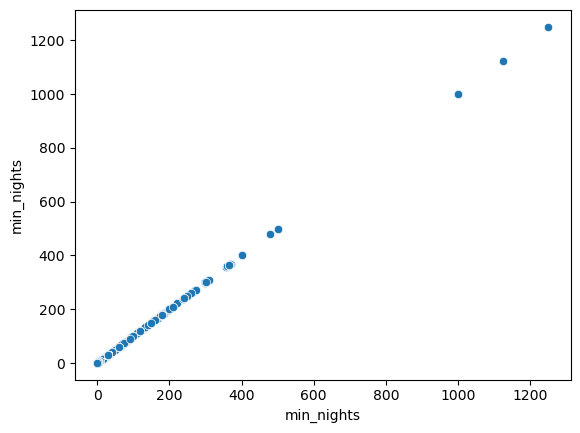

In [27]:
# generate scatterplot for outlier visualization in 'price'
sns.scatterplot(x = 'min_nights', y = 'min_nights', data = df_listings_2)

In [28]:
# calculate the IQR of 'minimum_nights'
min_nights_q1 = df_listings_2['min_nights'].quantile(0.25)
min_nights_q3 = df_listings_2['min_nights'].quantile(0.75)
min_nights_IQR = min_nights_q3 - min_nights_q1
print(min_nights_IQR)

28.0


In [29]:
# define upper and lower bounds for outliers in 'min_nights'
min_nights_spread = 1.5 * min_nights_IQR
min_nights_upper_bound = min_nights_q3 + min_nights_spread
min_nights_lower_bound = min_nights_q1 - min_nights_spread
print(min_nights_upper_bound)

72.0


In [30]:
# identify upper outliers in 'min_nights'
min_nights_outliers = df_listings_2[df_listings_2['min_nights'] > min_nights_upper_bound]
min_nights_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
11,15396,60278,Manhattan,Chelsea,40.744930,-73.995210,Entire home/apt,400,90,5,2018-11-03,0.06,1,107,0
28,61509,23619,Manhattan,Midtown,40.757430,-73.968250,Entire home/apt,110,200,92,2019-04-30,0.61,1,0,0
98,33156,128669,Manhattan,Upper West Side,40.787630,-73.968620,Entire home/apt,139,120,20,2020-10-14,0.14,1,58,0
101,36121,62165,Brooklyn,Prospect Heights,40.673760,-73.966110,Private room,100,90,9,2013-05-10,0.06,1,172,0
257,263502,1382749,Brooklyn,Williamsburg,40.718380,-73.956170,Entire home/apt,185,180,24,2015-08-19,0.17,1,365,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42636,886601349653370745,3223938,Brooklyn,Bushwick,40.696068,-73.920433,Private room,33,90,0,NaN,NaN,487,308,0
42858,891259523090721267,451251460,Bronx,Schuylerville,40.842760,-73.837700,Entire home/apt,72,120,0,NaN,NaN,1,363,0
42963,893770540161384256,484691150,Manhattan,Hell's Kitchen,40.763506,-73.995271,Private room,45,100,0,NaN,NaN,2,338,0
43304,902457879472632283,297867,Manhattan,Upper West Side,40.786592,-73.969837,Entire home/apt,131,75,0,NaN,NaN,1,98,0


In [31]:
# identify extreme outliers in 'min_nights'
min_nights_ex_outliers = df_listings_2[df_listings_2['min_nights'] > 800]
min_nights_ex_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
2027,2942732,160337,Manhattan,Washington Heights,40.83563,-73.94786,Entire home/apt,60,1124,9,2019-06-15,0.08,1,365,0
2778,4204302,17550546,Manhattan,Greenwich Village,40.73293,-73.99782,Entire home/apt,180,1250,2,2014-11-09,0.02,1,0,0
15090,30378211,200401254,Manhattan,Greenwich Village,40.73152,-74.00052,Shared room,31,999,0,NaN,NaN,1,0,0
19126,40302355,257908724,Manhattan,Morningside Heights,40.80440,-73.96574,Entire home/apt,50,1000,3,2020-01-29,0.07,1,0,0
19228,40368174,42061478,Manhattan,Washington Heights,40.85454,-73.93217,Private room,100,1000,1,2020-01-01,0.02,1,179,0


These values significantly exceed the expected range for the minimum number of nights. It is highly unreasonable to expect hosts to require customers to book a listing for 2-3 years. Therefore, considering they constitute an insignificant proportion of the sample size (approximately 0.01%), these values were removed from the DataFrame.

In [32]:
# remove extreme outliers in 'min_nights'
df_listings_3 = df_listings_2[df_listings_2['min_nights'] < 800]

In [33]:
# dataframe size
df_listings_3.shape

(43555, 15)

### `'reviews_count'` COLUMN

<Axes: xlabel='reviews_count', ylabel='reviews_count'>

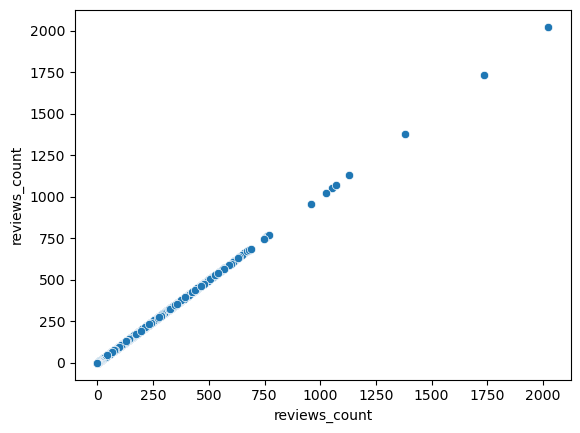

In [34]:
# generate scatterplot for outlier visualization in 'reviews_count'
sns.scatterplot(x = 'reviews_count', y = 'reviews_count', data = df_listings_3)

In [35]:
# calculate the IQR of 'reviews_count'
reviews_count_q1 = df_listings_3['reviews_count'].quantile(0.25)
reviews_count_q3 = df_listings_3['reviews_count'].quantile(0.75)
reviews_count_IQR = reviews_count_q3 - reviews_count_q1
print(reviews_count_IQR)

23.0


In [36]:
# define upper and lower bounds for outliers in 'reviews_count'
reviews_count_spread = 1.5 * reviews_count_IQR
reviews_count_upper_bound = reviews_count_q3 + reviews_count_spread
reviews_count_lower_bound = reviews_count_q1 - reviews_count_spread
print(reviews_count_upper_bound)

58.5


In [37]:
# identify upper outliers in 'review_counts'
reviews_count_outliers = df_listings_3[df_listings_3['reviews_count'] > reviews_count_upper_bound]
reviews_count_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
4,59709,186084,Manhattan,Chinatown,40.717800,-73.993200,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23
5,5178,8967,Manhattan,Midtown,40.764570,-73.983170,Private room,68,2,589,2023-05-14,3.44,1,10,51
7,5203,7490,Manhattan,Upper West Side,40.803800,-73.967510,Private room,75,2,118,2017-07-21,0.71,1,0,0
8,5803,9744,Brooklyn,South Slope,40.668010,-73.987840,Private room,134,3,233,2023-05-15,1.36,3,148,21
9,60164,289653,Manhattan,Tribeca,40.720120,-74.003970,Entire home/apt,500,30,110,2022-11-18,0.77,1,45,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34826,734881895316818067,22730283,Queens,Richmond Hill,40.704142,-73.818730,Private room,70,1,77,2023-06-01,9.83,3,338,77
34833,734914980193170094,22730283,Queens,Richmond Hill,40.704490,-73.818963,Private room,69,1,74,2023-06-02,9.53,3,336,74
35108,741178664950324853,324032905,Queens,Jamaica,40.707250,-73.788220,Entire home/apt,148,1,60,2023-05-31,8.33,1,347,60
35806,755866593147853163,427458930,Staten Island,Shore Acres,40.615000,-74.062970,Entire home/apt,142,1,60,2023-05-21,8.74,2,321,60


While it is evident that minld and extreme outliers exist in this column, it is not necessarily unreasonable for a specific listing to have a significantly high count of reviews. Factors such as increased demand and popularity can contribute to these listings receiving more reviews from customers. Therefore, removing them from the sample would be inappropriate.

### `'reviews_per_month'` COLUMN

<Axes: xlabel='monthly_reviews', ylabel='monthly_reviews'>

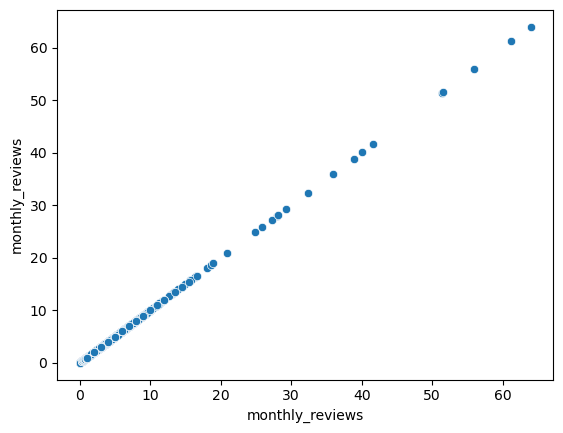

In [38]:
# generate scatterplot for outlier visualization in 'monthly_reviews'
sns.scatterplot(x = 'monthly_reviews', y = 'monthly_reviews', data = df_listings_3)

In [39]:
# calculate the IQR of 'monthly_reviews'
monthly_reviews_q1 = df_listings_3['monthly_reviews'].quantile(0.25)
monthly_reviews_q3 = df_listings_3['monthly_reviews'].quantile(0.75)
monthly_reviews_IQR = monthly_reviews_q3 - monthly_reviews_q1
print(monthly_reviews_IQR)

1.67


In [40]:
# define upper and lower bounds for outliers in 'monthly_reviews'
monthly_reviews_spread = 1.5 * monthly_reviews_IQR
monthly_reviews_upper_bound = monthly_reviews_q3 + monthly_reviews_spread
monthly_reviews_lower_bound = monthly_reviews_q1 - monthly_reviews_spread
print(monthly_reviews_upper_bound)

4.305


In [41]:
# identify upper outliers in 'monthly_reviews'
monthly_reviews_outliers = df_listings_3[df_listings_3['monthly_reviews'] > monthly_reviews_upper_bound]
monthly_reviews_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
223,58059,277379,Manhattan,Harlem,40.823800,-73.944440,Private room,61,29,659,2023-05-21,4.47,2,316,53
587,476983,277379,Manhattan,Harlem,40.823900,-73.942420,Private room,63,29,648,2023-05-29,4.86,2,116,56
799,713538,3672774,Brooklyn,Clinton Hill,40.683750,-73.961420,Entire home/apt,232,1,568,2023-05-21,4.46,3,67,53
1070,945297,5074654,Manhattan,East Village,40.730240,-73.981470,Private room,108,1,671,2023-05-20,5.40,1,187,75
1100,1144861,252361,Brooklyn,Cobble Hill,40.688120,-73.991550,Entire home/apt,230,1,526,2023-05-30,4.34,1,177,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
42792,892063550476731196,511762352,Bronx,Parkchester,40.834219,-73.859606,Private room,91,1,5,2023-06-04,5.00,1,357,5
42809,889862196019334709,228879817,Queens,Flushing,40.761071,-73.809949,Private room,68,1,6,2023-06-04,6.00,15,0,6
42849,892239067236445060,512834300,Queens,Flushing,40.765257,-73.829317,Entire home/apt,142,1,5,2023-05-30,5.00,8,83,5
42870,891329391323275080,512834300,Queens,Flushing,40.763225,-73.828473,Entire home/apt,173,1,6,2023-05-29,6.00,8,168,6


This column shares a similar situation with the `'reviews_count'` column. Although the presence of outliers is evident, it is reasonable to have a high count of reviews per month considering the nature of the service. Therefore, it is recommended not to address or remove these outliers from the dataset.

### `'host_list_count'` COLUMN

<Axes: xlabel='host_list_count', ylabel='host_list_count'>

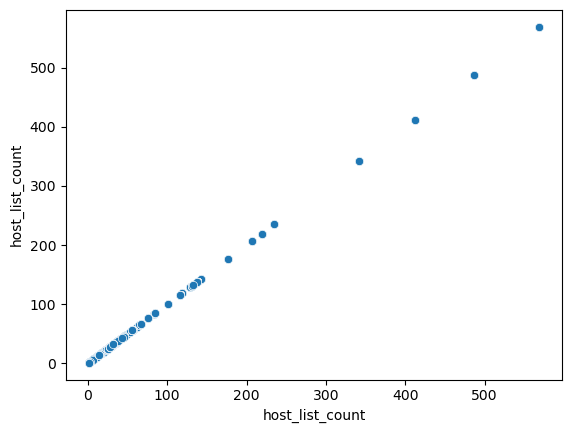

In [42]:
# generate scatterplot for outlier visualization in 'host_list_count'
sns.scatterplot(x = 'host_list_count', y = 'host_list_count', data = df_listings_3)

In [43]:
# calculate the IQR of 'host_list_count'
host_list_count_q1 = df_listings_3['host_list_count'].quantile(0.25)
host_list_count_q3 = df_listings_3['host_list_count'].quantile(0.75)
host_list_count_IQR = host_list_count_q3 - host_list_count_q1
print(host_list_count_IQR)

4.0


In [44]:
# define upper and lower bounds for outliers in 'host_list_count'
host_list_count_spread = 1.5 * host_list_count_IQR
host_list_count_upper_bound = host_list_count_q3 + host_list_count_spread
host_list_count_lower_bound = host_list_count_q1 - host_list_count_spread
print(host_list_count_upper_bound)

11.0


In [45]:
# identify upper outliers in 'host_list_count'
host_list_count_outliers = df_listings_3[df_listings_3['host_list_count'] > host_list_count_upper_bound]
host_list_count_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
152,77765,417504,Brooklyn,Greenpoint,40.737770,-73.953660,Hotel room,299,1,51,2023-05-29,0.34,30,120,10
161,80684,417504,Brooklyn,Greenpoint,40.737560,-73.953500,Hotel room,449,1,11,2022-09-12,0.08,30,124,1
163,80700,417504,Brooklyn,Greenpoint,40.737770,-73.953660,Private room,429,1,10,2022-10-22,0.07,30,124,2
169,81739,417504,Brooklyn,Greenpoint,40.737770,-73.953660,Private room,429,1,2,2011-05-12,0.01,30,124,0
182,84010,417504,Brooklyn,Greenpoint,40.737770,-73.953660,Hotel room,299,1,26,2022-12-05,0.18,30,123,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43556,905010695655980384,40319757,Manhattan,Hell's Kitchen,40.766500,-73.988536,Entire home/apt,1400,3,0,NaN,NaN,14,362,0
43558,905014056309001956,40319757,Manhattan,Civic Center,40.714259,-74.005310,Entire home/apt,997,1,0,NaN,NaN,14,365,0
43560,905019259198729323,40319757,Manhattan,Chinatown,40.718730,-74.001030,Entire home/apt,1300,1,0,NaN,NaN,14,364,0
43563,905066559607295258,22541573,Manhattan,East Village,40.732530,-73.989880,Entire home/apt,382,30,0,NaN,NaN,132,288,0


Approximately 17% of the sample values in the 'host_list_count' column are considered outliers. While some of these values may appear unusually high, it is challenging to determine whether a host genuinely possesses a high count of listings. Given this difficulty in assessment, no changes or adjustments are recommended for this column.

### `'availability_365'` COLUMN

<Axes: xlabel='availability_365', ylabel='availability_365'>

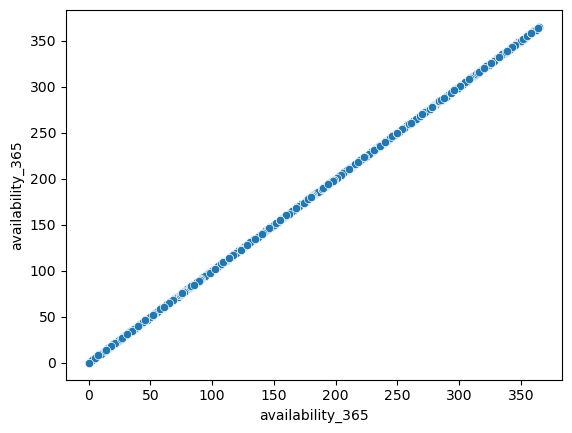

In [46]:
# generate scatterplot for outlier visualization in 'availability_365'
sns.scatterplot(x = 'availability_365', y = 'availability_365', data = df_listings_3)

This column does not exhibit any outliers as all the values fall within the range of 0 to 365, which aligns with the number of days in a year. It is probable that range constraints were implemented in the input methods, resulting in the limited range of values observed in this column.

In [47]:
# calculate the IQR of 'availability_365'
availability_365_q1 = df_listings_3['availability_365'].quantile(0.25)
availability_365_q3 = df_listings_3['availability_365'].quantile(0.75)
availability_365_IQR = availability_365_q3 - availability_365_q1
print(availability_365_IQR)

278.0


### `'reviews_count_ltm'` COLUMN

<Axes: xlabel='reviews_count_ltm', ylabel='reviews_count_ltm'>

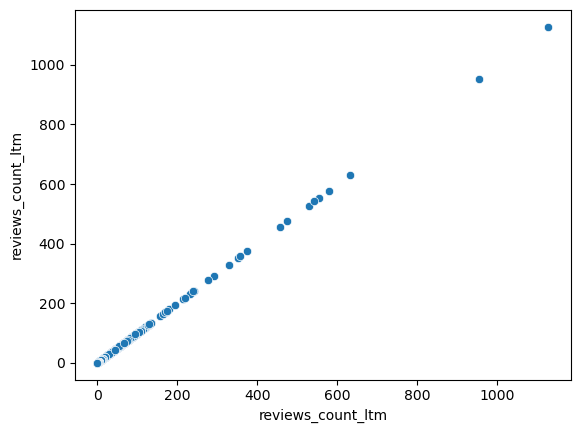

In [48]:
# generate scatterplot for outlier visualization in 'host_list_count'
sns.scatterplot(x = 'reviews_count_ltm', y = 'reviews_count_ltm', data = df_listings_3)

In [49]:
# calculate the IQR of 'host_list_count'
reviews_count_ltm_q1 = df_listings_3['reviews_count_ltm'].quantile(0.25)
reviews_count_ltm_q3 = df_listings_3['reviews_count_ltm'].quantile(0.75)
reviews_count_ltm_IQR = reviews_count_ltm_q3 - reviews_count_ltm_q1
print(reviews_count_ltm_IQR)

8.0


In [50]:
# define upper and lower bounds for outliers in 'host_list_count'
reviews_count_ltm_spread = 1.5 * reviews_count_ltm_IQR
reviews_count_ltm_upper_bound = reviews_count_ltm_q3 + reviews_count_ltm_spread
host_list_count_lower_bound = reviews_count_ltm_q1 - reviews_count_ltm_spread
print(host_list_count_upper_bound)

11.0


In [51]:
# identify upper outliers in 'host_list_count'
reviews_count_ltm_outliers = df_listings_3[df_listings_3['reviews_count_ltm'] > host_list_count_upper_bound]
reviews_count_ltm_outliers

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
4,59709,186084,Manhattan,Chinatown,40.717800,-73.993200,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23
5,5178,8967,Manhattan,Midtown,40.764570,-73.983170,Private room,68,2,589,2023-05-14,3.44,1,10,51
8,5803,9744,Brooklyn,South Slope,40.668010,-73.987840,Private room,134,3,233,2023-05-15,1.36,3,148,21
18,16580,64442,Manhattan,East Village,40.724890,-73.978100,Private room,143,1,502,2023-05-21,4.21,2,155,44
19,60666,256161,Manhattan,Harlem,40.810060,-73.945590,Private room,111,3,268,2023-05-30,1.77,4,19,40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41303,859771139425703476,471548508,Manhattan,Harlem,40.816285,-73.945434,Entire home/apt,185,1,14,2023-05-30,7.12,6,43,14
41505,864416473972405856,508605356,Queens,Flushing,40.735182,-73.795137,Private room,89,1,12,2023-06-03,6.21,1,145,12
41743,867962291226955668,463425587,Manhattan,Hell's Kitchen,40.761362,-73.989300,Private room,307,1,44,2023-05-22,24.91,3,359,44
41946,871264661238205649,510399716,Queens,Woodhaven,40.698065,-73.850978,Entire home/apt,99,1,14,2023-06-03,10.77,1,16,14


Over 20% of the values in this column can be classified as outliers. However, similar to the aforementioned columns, it is not unexpected to have a specific listing exhibiting a high number of reviews in the last 12 months, considering the nature of the service. Therefore, it is recommended not to address or remove these outliers as they likely represent valid data points in the dataset.

## CONSISTENCY

### MISSING VALUES

In [52]:
# identify missing values
df_listings_3.isnull().sum()

id                       0
host_id                  0
nbhd_group               0
nbhd                     0
latitude                 0
longitude                0
room_type                0
price                    0
min_nights               0
reviews_count            0
last_review          10493
monthly_reviews      10493
host_list_count          0
availability_365         0
reviews_count_ltm        0
dtype: int64

In [53]:
# display rows with missing values in 'reviews_per_month'
df_listings_3[pd.isnull(df_listings_3['monthly_reviews'])]

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
29,18018,69439,Manhattan,Lower East Side,40.720982,-73.993150,Entire home/apt,215,30,0,NaN,NaN,1,249,0
36,63588,295128,Bronx,Clason Point,40.811610,-73.854990,Private room,89,30,0,NaN,NaN,6,0,0
48,64015,146944,Manhattan,East Village,40.728630,-73.984200,Entire home/apt,200,30,0,NaN,NaN,1,0,0
55,11943,45445,Brooklyn,Flatbush,40.637020,-73.963270,Private room,150,30,0,NaN,NaN,1,0,0
103,68253,67730,Queens,Astoria,40.763360,-73.920990,Private room,55,30,0,NaN,NaN,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
43561,905031073149861760,86368678,Brooklyn,Canarsie,40.633458,-73.899472,Entire home/apt,208,3,0,NaN,NaN,3,358,0
43562,905038362467988591,52064945,Brooklyn,Park Slope,40.677256,-73.981435,Private room,530,30,0,NaN,NaN,1,270,0
43563,905066559607295258,22541573,Manhattan,East Village,40.732530,-73.989880,Entire home/apt,382,30,0,NaN,NaN,132,288,0
43564,905077900484113845,151692758,Brooklyn,Canarsie,40.638210,-73.915920,Entire home/apt,199,2,0,NaN,NaN,1,155,0


Rows with missing values in both the `'last_review'` and `'monthly_reviews'` columns occur when the corresponding value in the `'number_of_reviews'` column is zero. This is a logical observation since a value of zero in `'number_of_reviews'` indicates that there are no reviews for that specific listing. Considering the nature of the data, this scenario is expected and explains the missing values. 

To ensure the accuracy of advanced analysis methods, it is crucial to address missing values appropriately. Instead of leaving them as blanks, it is recommended to assign specific labels that indicate the absence or unavailability of data. For this particular analysis, we will designate the missing values in the `'last_review'` column as **"Unavailable"** and those in the `'monthly_reviews'` column as **"0"**. By applying consistent labeling throughout the dataset, we can maintain data integrity and facilitate accurate analysis.

In [54]:
# replace NaN values in 'last_review'
df_listings_4 = df_listings_3.fillna({'last_review' : 'Unavailable'})

# examine changes
df_listings_4['last_review'].isnull().sum()

0

In [55]:
# replace NaN values in 'monthly_reviews'
df_listings_4.fillna({'monthly_reviews' : 0}, inplace = True)

# examine changes
df_listings_4['monthly_reviews'].isnull().sum()

0

In [56]:
# identify missing values
df_listings_4.isnull().sum()

id                   0
host_id              0
nbhd_group           0
nbhd                 0
latitude             0
longitude            0
room_type            0
price                0
min_nights           0
reviews_count        0
last_review          0
monthly_reviews      0
host_list_count      0
availability_365     0
reviews_count_ltm    0
dtype: int64

### MIXED-TYPE DATA

In [57]:
# evaluate 'df_listings_1' dataframe for mixed-type columns
for col in df_listings_4.columns.tolist():
  weird = (df_listings_4[[col]].applymap(type) != df_listings_4[[col]].iloc[0].apply(type)).any(axis = 1)
  if len (df_listings_4[weird]) > 0:
    print (col)

No mixed-type columns found.

### DUPLICATE VALUES

In [58]:
# identify full duplicates
df_listings_1[df_listings_1.duplicated()]

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm


No full duplicates were found.

# INITIAL DATA EXPLORATION

In [59]:
# value counts per column
df_listings_4.count()

id                   43555
host_id              43555
nbhd_group           43555
nbhd                 43555
latitude             43555
longitude            43555
room_type            43555
price                43555
min_nights           43555
reviews_count        43555
last_review          43555
monthly_reviews      43555
host_list_count      43555
availability_365     43555
reviews_count_ltm    43555
dtype: int64

In [60]:
# unique value counts per column
df_listings_4.nunique()

id                   43555
host_id              27393
nbhd_group               5
nbhd                   223
latitude             24586
longitude            22105
room_type                4
price                 1235
min_nights             127
reviews_count          490
last_review           2859
monthly_reviews        880
host_list_count         70
availability_365       366
reviews_count_ltm      155
dtype: int64

In [61]:
# unique values in 'neighbourhood_group'
df_listings_4['nbhd_group'].unique()

array(['Brooklyn', 'Manhattan', 'Bronx', 'Queens', 'Staten Island'],
      dtype=object)

In [62]:
# unique values in 'neighbourhood'
df_listings_4['nbhd'].unique()

array(['Bedford-Stuyvesant', 'Midtown', 'Lower East Side', 'Sunset Park',
       'Chinatown', 'Upper West Side', 'South Slope', 'Tribeca',
       'Williamsburg', 'Chelsea', 'East Village', 'Greenwich Village',
       'Clinton Hill', 'East Harlem', 'Harlem', 'Washington Heights',
       'Upper East Side', 'Fort Greene', 'Greenpoint', 'Clason Point',
       'Kips Bay', 'Eastchester', 'Flatbush', "Hell's Kitchen",
       'Crown Heights', 'Carroll Gardens', 'West Village', 'Nolita',
       'Park Slope', 'Long Island City', 'East Flatbush', 'Gowanus',
       'Forest Hills', 'Murray Hill', 'Prospect Heights', 'Astoria',
       'Boerum Hill', 'Sunnyside', 'Kingsbridge', 'St. George',
       'Ridgewood', 'Mott Haven', 'Morningside Heights', 'Bushwick',
       'Ditmars Steinway', 'Middle Village', 'Jamaica', 'Windsor Terrace',
       'University Heights', 'Brooklyn Heights', 'Flatiron District',
       'Rockaway Beach', 'Allerton', 'Emerson Hill', 'East New York',
       'Theater District', 'Fo

In [63]:
# unique values in 'room_type'
df_listings_4['room_type'].unique()

array(['Private room', 'Entire home/apt', 'Hotel room', 'Shared room'],
      dtype=object)

## QUANTITATIVE VARIABLES

In [64]:
# summary stats
stats_columns_to_exclude = ['id', 'host_id', 'latitude', 'longitude']
df_summary_stats = df_listings_4.drop(columns = stats_columns_to_exclude)
df_summary_stats.describe()

,price,min_nights,reviews_count,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
count,43555.000000,43555.000000,43555.000000,43555.000000,43555.000000,43555.000000,43555.000000
mean,218.863850,18.579474,26.373367,0.926091,30.941958,137.002411,7.883940
std,442.462035,25.378979,57.746498,1.633940,99.120115,137.343087,18.252904
min,10.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,80.000000,2.000000,1.000000,0.010000,1.000000,0.000000,0.000000
50%,136.000000,15.000000,5.000000,0.230000,1.000000,89.000000,1.000000
75%,229.000000,30.000000,24.000000,1.270000,5.000000,278.000000,8.000000
max,20500.000000,500.000000,2024.000000,63.950000,569.000000,365.000000,1128.000000


<Axes: ylabel='Frequency'>

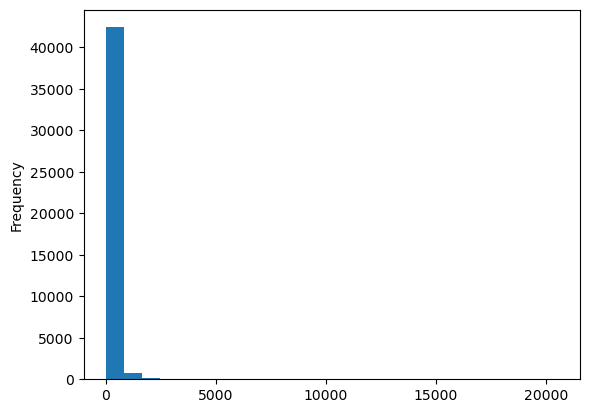

In [65]:
# explore the distribution of 'price'
df_listings_4['price'].plot.hist(bins = 25)

In [66]:
# calculate the median value of 'price'
price_median = df_listings_4['price'].median()
print(price_median)

136.0


<Axes: ylabel='Frequency'>

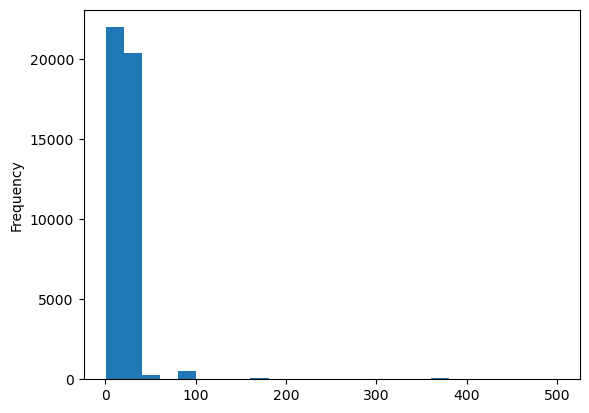

In [67]:
# explore the distribution of 'min_nights'
df_listings_4['min_nights'].plot.hist(bins = 25)

In [68]:
# calculate the median value of 'min_nights'
min_nights_median = df_listings_4['min_nights'].median()
print(min_nights_median)

15.0


<Axes: ylabel='Frequency'>

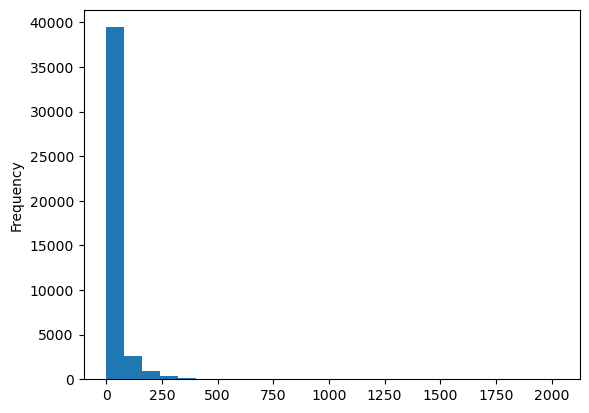

In [69]:
# explore the distribution of 'reviews_count'
df_listings_4['reviews_count'].plot.hist(bins = 25)

In [70]:
# calculate the median value of 'reviews_count'
reviews_count_median = df_listings_4['reviews_count'].median()
print(reviews_count_median)

5.0


<Axes: ylabel='Frequency'>

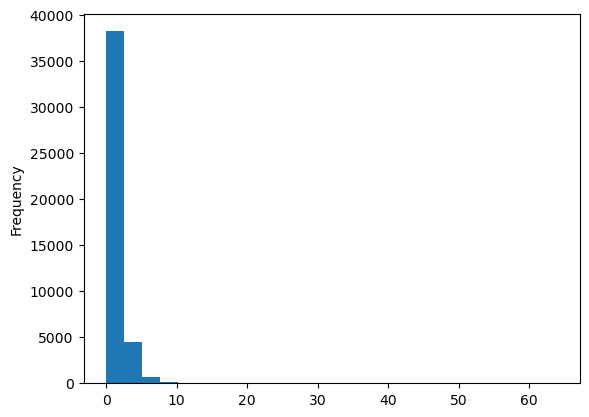

In [71]:
# explore the distribution of 'monthly_reviews'
df_listings_4['monthly_reviews'].plot.hist(bins = 25)

In [72]:
# calculate the median value of 'monthly_reviews'
monthly_reviews_median = df_listings_4['monthly_reviews'].median()
print(monthly_reviews_median)

0.23


<Axes: ylabel='Frequency'>

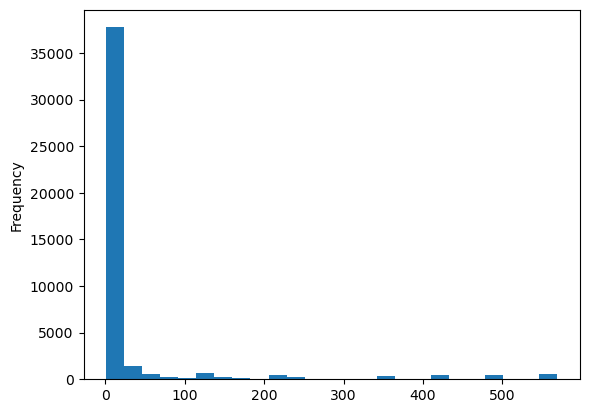

In [73]:
# explore the distribution of 'host_list_count'
df_listings_4['host_list_count'].plot.hist(bins = 25)

In [74]:
# calculate the median value of 'host_list_count'
host_list_count_median = df_listings_4['host_list_count'].median()
print(host_list_count_median)

1.0


<Axes: ylabel='Frequency'>

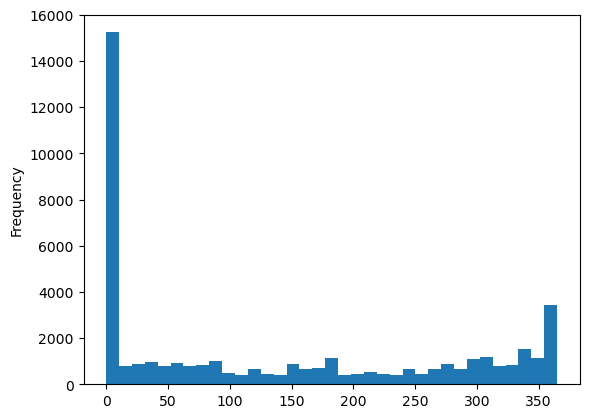

In [75]:
# explore the distribution of 'availability_365'
df_listings_4['availability_365'].plot.hist(bins=35)

In [76]:
# calculate the median value of 'availability_365'
availability_365_median = df_listings_4['availability_365'].median()
print(availability_365_median)

89.0


<Axes: ylabel='Frequency'>

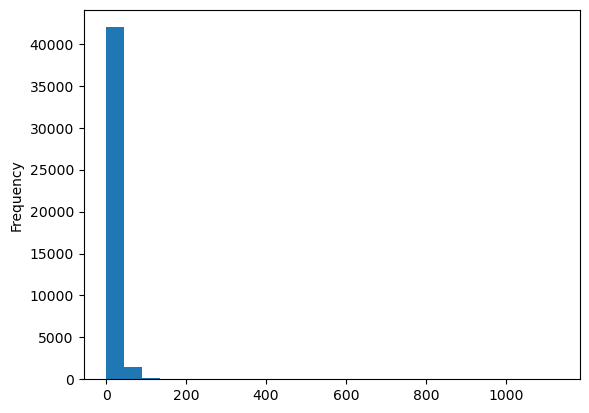

In [77]:
# explore the distribution of 'reviews_count_ltm'
df_listings_4['reviews_count_ltm'].plot.hist(bins = 25)

In [78]:
# calculate the median value of 'reviews_count_ltm'
reviews_count_ltm_median = df_listings_4['reviews_count_ltm'].median()
print(reviews_count_ltm_median)

1.0


## QUALITATIVE VARIABLES

In [79]:
# first 5 rows
df_listings_4.head()

,id,host_id,nbhd_group,nbhd,latitude,longitude,room_type,price,min_nights,reviews_count,last_review,monthly_reviews,host_list_count,availability_365,reviews_count_ltm
0,5121,7356,Brooklyn,Bedford-Stuyvesant,40.68535,-73.95512,Private room,60,30,50,2019-12-02,0.29,2,0,0
1,2595,2845,Manhattan,Midtown,40.75356,-73.98559,Entire home/apt,240,30,49,2022-06-21,0.30,3,325,1
2,14991,59023,Manhattan,Lower East Side,40.72207,-73.98976,Private room,120,5,22,2023-05-14,0.14,1,268,3
3,5136,7378,Brooklyn,Sunset Park,40.66265,-73.99454,Entire home/apt,276,21,3,2022-08-10,0.03,1,275,1
4,59709,186084,Manhattan,Chinatown,40.71780,-73.99320,Entire home/apt,325,7,69,2023-04-28,0.47,1,38,23


In [80]:
# calculate the mode of 'id'
df_listings_4['id'].mode().values[0]

2595

In [81]:
# calculate the mode of 'host_id'
df_listings_4['host_id'].mode().values[0]

107434423

In [82]:
# calculate the mode of 'nbhd_group'
df_listings_4['nbhd_group'].mode().values[0]

'Manhattan'

In [83]:
# calculate the mode of 'nbhd'
df_listings_4['nbhd'].mode().values[0]

'Bedford-Stuyvesant'

In [84]:
# calculate the mode of 'latitude'
df_listings_4['latitude'].mode().values[0]

40.76153

In [85]:
# calculate the mode of 'longitude'
df_listings_4['longitude'].mode().values[0]

-73.99878

In [86]:
# calculate the mode of 'room_type'
df_listings_4['room_type'].mode().values[0]

'Entire home/apt'

In [87]:
# calculate the mode of 'last_review'
df_listings_4['last_review'].mode().values[0]

'Unavailable'

# DATA PROFILE

In [88]:
# generate detailed data profile
listings_profile = ProfileReport(df_listings_4, title = 'NYC Airbnb Listings Profile')
listings_profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [89]:
# export data profile
listings_profile.to_file(os.path.join(path, '04 Analysis', 'nyc_airbnb_listings_profile.html'))

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

# EXPORTING DATA

In [90]:
# export dataframe
df_listings_4.to_pickle(os.path.join(path, '02 Data', 'Processed Data', 'listings_clean.pkl'))